In [3]:
import os
import numpy as np
import pandas as pd
from wfdb import processing

%config InlineBackend.figure_formats = ['svg']

import matplotlib.pyplot as plt
%matplotlib inline

import colorcet as cc

import seaborn as sns 

In [4]:
folder_path = '../../Data/LoHP/MultiRecordFiles/'

columns = ['I', 'II', 'III', 'aVR', 'aVL', 'aVF', 'C1', 'Resp', 'UTC', 'DA', 'Conf']
columns_ruhe = ['I', 'II', 'III', 'aVR', 'aVL', 'aVF', 'C1', 'Resp']

lengths = ['filenames', 'values']

sampling_rate = 300

eval_columns = ['HR', 'SL', 'FileName']

sl_sc1_list = []
hr_sc1_list = []
vp_sc1_list = []

file_sc1_list = []

sl_sc2_list = []
hr_sc2_list = []
vp_sc2_list = []

file_sc2_list = []

In [5]:
for root, subdirs, files in os.walk(folder_path, topdown=True):
    
    for file in files:
        
        if file.endswith('Scenario2_MRF.csv'):
            print(file)
            #print('Scenario 2')
            file_path = os.path.join(root, file)
            
            df = pd.read_csv(file_path, delimiter=',', usecols=columns)
            
            xqrs = processing.XQRS(sig=df['II'], fs=sampling_rate)
            
            xqrs.detect()

            # XQRS inds in samples -> to seconds divide by sampling rate
            # From seconds to ms multipy by 1000
            rr = np.diff(xqrs.qrs_inds)*1000 / sampling_rate

            # From ms to min divide rr by 60000
            heart_rate_r2 = 60 * 1000 / rr
            
            sl_temp = df.loc[xqrs.qrs_inds, 'DA'].tolist()
            sl_temp.pop(0)
            
            sl_sc2_list.extend(sl_temp)
            hr_sc2_list.extend(heart_rate_r2)
            
            print(len(sl_temp))
            
            file_names = [file for i in range(len(sl_temp))]
            
            file_sc2_list.extend(file_names)
            
            t_file_name = file.removesuffix('_Scenario2_MRF.csv')
            
            print(f"File name: {t_file_name}")
            
            t_vp_list = [t_file_name for i in range(len(sl_temp))]

            vp_sc2_list.extend(t_vp_list)
            
            
        elif file.endswith('Scenario1_MRF.csv'):
            print(file)
            #print('Scenario 1')
            
            file_path = os.path.join(root, file)
            
            df = pd.read_csv(file_path, delimiter=',', usecols=columns)
            
            xqrs = processing.XQRS(sig=df['II'], fs=sampling_rate)
            
            xqrs.detect()

            # XQRS inds in samples -> to seconds divide by sampling rate
            # From seconds to ms multipy by 1000
            rr = np.diff(xqrs.qrs_inds)*1000 / sampling_rate

            # From ms to min divide rr by 60000
            heart_rate_r2 = 60 * 1000 / rr
            
            sl_temp = df.loc[xqrs.qrs_inds, 'DA'].tolist()
            sl_temp.pop(0)
            
            sl_sc1_list.extend(sl_temp)
            hr_sc1_list.extend(heart_rate_r2)
            
            print(len(sl_temp))
            file_names = [file for i in range(len(sl_temp))]
            
            file_sc1_list.extend(file_names)
            
            t_file_name = file.removesuffix('_Scenario1_MRF.csv')
            
            print(f"File name: {t_file_name}")
            t_vp_list = [t_file_name for i in range(len(sl_temp))]

            vp_sc1_list.extend(t_vp_list)
            
        elif file.endswith('RuheEKG.csv'):
            print(file)
            #print('Ruhe EKG')
            #file_path = os.path.join(root, file)
            
            #df = pd.read_csv(file_path, delimiter=',', usecols=columns_ruhe)
            
            #print(f'Shape: {df.shape}')
            
            
        else:
            print(file)
            #print('Different File')

VP1_RuheEKG.csv
VP2_RuheEKG.csv
VP3_RuheEKG.csv
VP3_Scenario1_MRF.csv
Learning initial signal parameters...
Found 8 beats during learning. Initializing using learned parameters
Running QRS detection...
QRS detection complete.
2984
File name: VP3
VP4_RuheEKG.csv
VP4_Scenario1_MRF.csv
Learning initial signal parameters...
Found 8 beats during learning. Initializing using learned parameters
Running QRS detection...
QRS detection complete.
2476
File name: VP4
VP4_Scenario2_MRF.csv
Learning initial signal parameters...
Found 8 beats during learning. Initializing using learned parameters
Running QRS detection...
QRS detection complete.
5144
File name: VP4
VP5_RuheEKG.csv
VP5_Scenario1_MRF.csv
Learning initial signal parameters...
Found 8 beats during learning. Initializing using learned parameters
Running QRS detection...
QRS detection complete.
2572
File name: VP5
VP6_RuheEKG.csv
VP6_Scenario1_MRF.csv
Learning initial signal parameters...
Found 8 beats during learning. Initializing using le

In [6]:
print(len(sl_sc1_list))
print(len(hr_sc1_list))
print(len(file_sc1_list))

print(len(sl_sc2_list))
print(len(hr_sc2_list))
print(len(file_sc2_list))

39014
39014
39014
65521
65521
65521


In [7]:
hr_list = []
sl_list = []
vp_list = []

sl_list.extend(sl_sc1_list)
sl_list.extend(sl_sc2_list)

hr_list.extend(hr_sc1_list)
hr_list.extend(hr_sc2_list)

vp_list.extend(vp_sc1_list)
vp_list.extend(vp_sc2_list)

sc1 = ['Scenario1' for i in range(len(sl_sc1_list))]
sc2 = ['Scenario2' for i in range(len(sl_sc2_list))]

scenario_list = []
scenario_list.extend(sc1)
scenario_list.extend(sc2)

In [8]:
eval_columns_facet = ['HR', 'SL', 'VP', 'Scenario']

data_tuples = list(zip(hr_list, sl_list, vp_list, scenario_list))

hrsl_facet_df = pd.DataFrame(data_tuples, columns=eval_columns_facet)

(-0.5, 10.5)

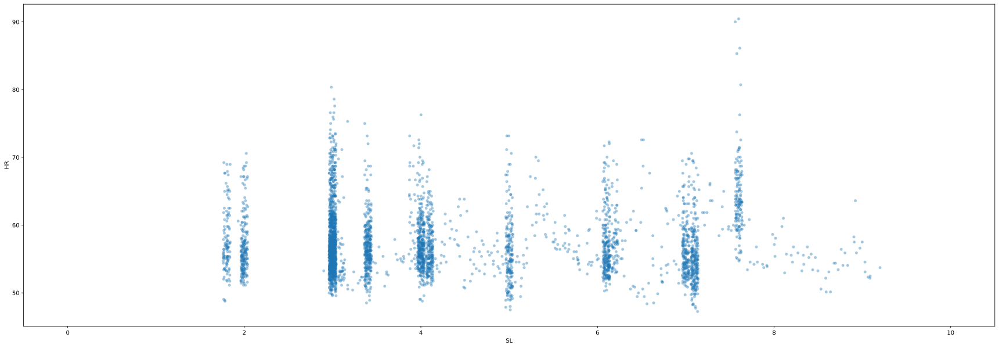

In [88]:
example_df = hrsl_facet_df[(hrsl_facet_df['VP']=='VP15') & (hrsl_facet_df['Scenario']=='Scenario2')].copy()

plt.rcParams["figure.figsize"] = (30,10)
#example_df = np.round(example_df, 1)
plot = sns.stripplot(data=example_df, x="SL", y="HR", jitter=4, alpha=0.4, native_scale=True)

plt.xlim([-0.5,10.5])
#plot.tick_params(axis='x', rotation=45)

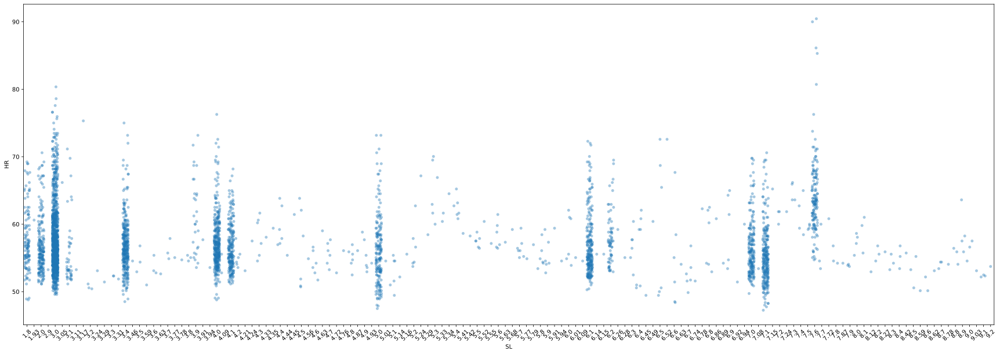

In [81]:
example_df = hrsl_facet_df[(hrsl_facet_df['VP']=='VP15') & (hrsl_facet_df['Scenario']=='Scenario2')].copy()

plt.rcParams["figure.figsize"] = (30,10)
#example_df = np.round(example_df, 1)
plot = sns.stripplot(data=example_df, x="SL", y="HR", jitter=0.4, alpha=0.4)

plot.tick_params(axis='x', rotation=45)

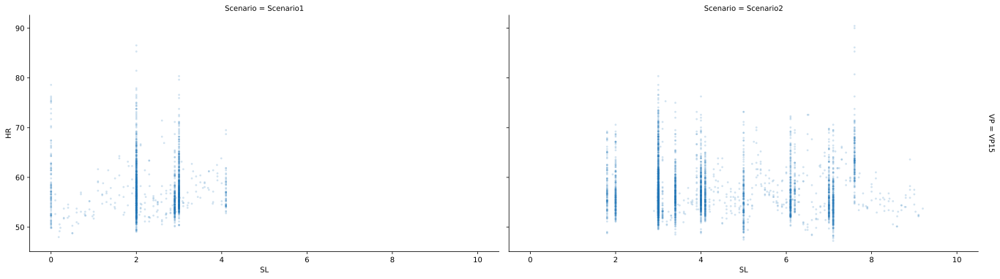

In [11]:
example_df = hrsl_facet_df[(hrsl_facet_df['VP']=='VP15')].copy()

plt.rcParams["figure.figsize"] = (20,15)
faceplot = sns.FacetGrid(example_df, col='Scenario', row='VP', margin_titles=True, aspect=2, height=5)
faceplot.map(sns.scatterplot, 'SL', 'HR', s=8, linewidth = 0.01, alpha=0.2)
faceplot.set_titles("{col_name}")

plt.xlim([-0.5,10.5])
plt.subplots_adjust(
    left=0.06,
    bottom=0.075,
    right=0.96,
    top=0.975,
    hspace=0.025)
faceplot.savefig(f"Graphics/GMLF_example.pdf", format="pdf")

/Users/MacMaster3/opt/anaconda3/lib/python3.9/site-packages/seaborn/axisgrid.py:670: UserWarning: Using the stripplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


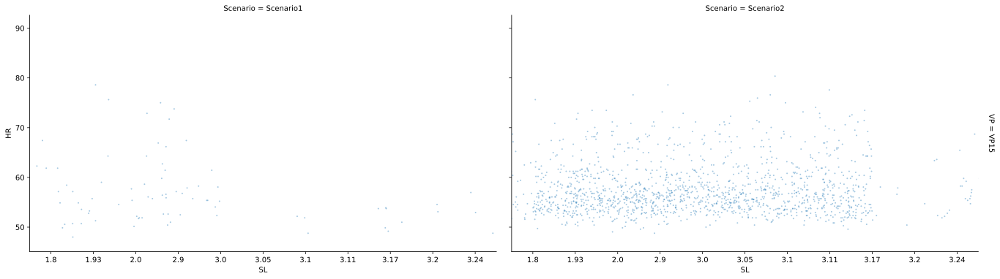

In [13]:
example_df = hrsl_facet_df[(hrsl_facet_df['VP']=='VP15')].copy()

plt.rcParams["figure.figsize"] = (20,15)
faceplot = sns.FacetGrid(example_df, col='Scenario', row='VP', margin_titles=True, aspect=2, height=5)
faceplot.map(sns.stripplot, 'SL', 'HR', s=2, jitter=4, alpha=0.4)
faceplot.set_titles("{col_name}")

plt.xlim([-0.5,10.5])
plt.subplots_adjust(
    left=0.06,
    bottom=0.075,
    right=0.96,
    top=0.975,
    hspace=0.025)
faceplot.savefig(f"Graphics/GMLF_example.pdf", format="pdf")

In [14]:
extract_df = hrsl_facet_df[(hrsl_facet_df['VP']=='VP17') | (hrsl_facet_df['VP']=='VP18') | (hrsl_facet_df['VP']=='VP19') | (hrsl_facet_df['VP']=='VP20')].copy()


faceplot = sns.FacetGrid(extract_df, col='Scenario', row='VP', margin_titles=True, aspect=2, height=3)
faceplot.map(sns.scatterplot, 'SL', 'HR', s=8, linewidth = 0.01, alpha=0.2)
faceplot.set_titles("{col_name}")
plt.subplots_adjust(
    left=0.06,
    bottom=0.05,
    right=0.96,
    top=0.975,
    hspace=0.025)
faceplot.savefig(f"Graphics/GMLF_t4.pdf", format="pdf")

In [15]:
data_tuples_sc1 = list(zip(hr_sc1_list, sl_sc1_list, file_sc1_list))

hrsl_sc1_df = pd.DataFrame(data_tuples_sc1, columns=eval_columns)

sl_sc1_df = pd.DataFrame(sl_sc1_list)
hr_sc1_df = pd.DataFrame(hr_sc1_list)

In [16]:
data_tuples_sc2 = list(zip(hr_sc2_list, sl_sc2_list, file_sc2_list))

hrsl_sc2_df = pd.DataFrame(data_tuples_sc2, columns=eval_columns)

sl_sc2_df = pd.DataFrame(sl_sc2_list)
hr_sc2_df = pd.DataFrame(hr_sc2_list)

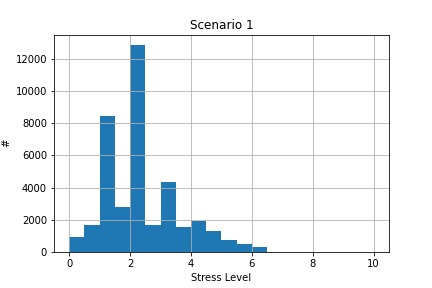

In [19]:
%matplotlib widget
sl_sc1_df.hist(bins=np.arange(0,10,.5))
plt.title('Scenario 1')

plt.xlim([-0.5,10.5])

plt.xlabel('Stress Level')
plt.ylabel('#')
plt.savefig(f"Graphics/GMLF_SL_SC1.pdf", format="pdf")

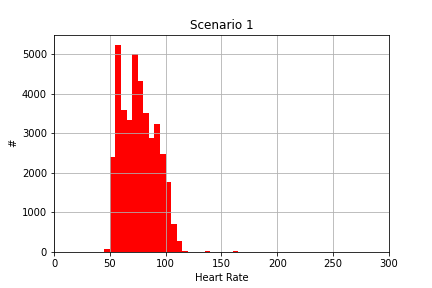

In [20]:
%matplotlib widget
hr_sc1_df.hist(bins=np.arange(0,300,5), color='red')
plt.title('Scenario 1')

plt.xlabel('Heart Rate')
plt.ylabel('#')
plt.xlim([0,300])

plt.savefig(f"Graphics/GMLF_HR_SC1.pdf", format="pdf")

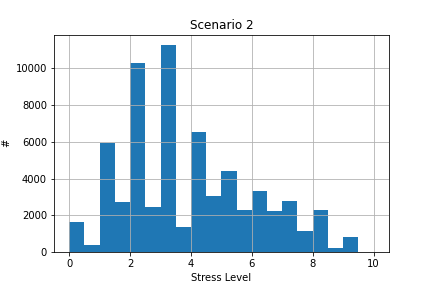

In [21]:
%matplotlib widget

sl_sc2_df.hist(bins=np.arange(0,10,.5))
plt.title('Scenario 2')

plt.xlabel('Stress Level')
plt.ylabel('#')
plt.xlim([-0.5,10.5])

plt.savefig(f"Graphics/GMLF_SL_SC2.pdf", format="pdf")

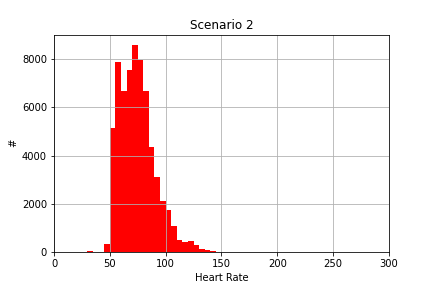

In [22]:
%matplotlib widget

hr_sc2_df.hist(bins=np.arange(0,300,5), color='red')
plt.title('Scenario 2')

plt.xlabel('Heart Rate')
plt.ylabel('#')

plt.xlim([0,300])

plt.savefig(f"Graphics/GMLF_HR_SC2.pdf", format="pdf")

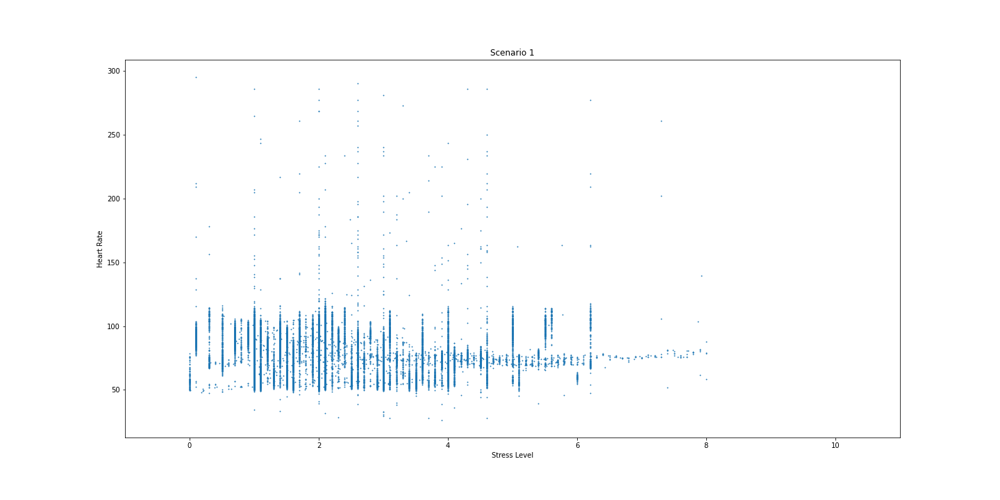

In [25]:
%matplotlib widget

plt.rcParams["figure.figsize"] = (20,10)
plt.scatter(sl_sc1_list,hr_sc1_list, s=0.7)
plt.title('Scenario 1')
plt.xlabel('Stress Level')
plt.ylabel('Heart Rate')

plt.xlim([-1,11])

plt.savefig(f"Graphics/GMLF_Distr_Sc1.pdf", format="pdf")

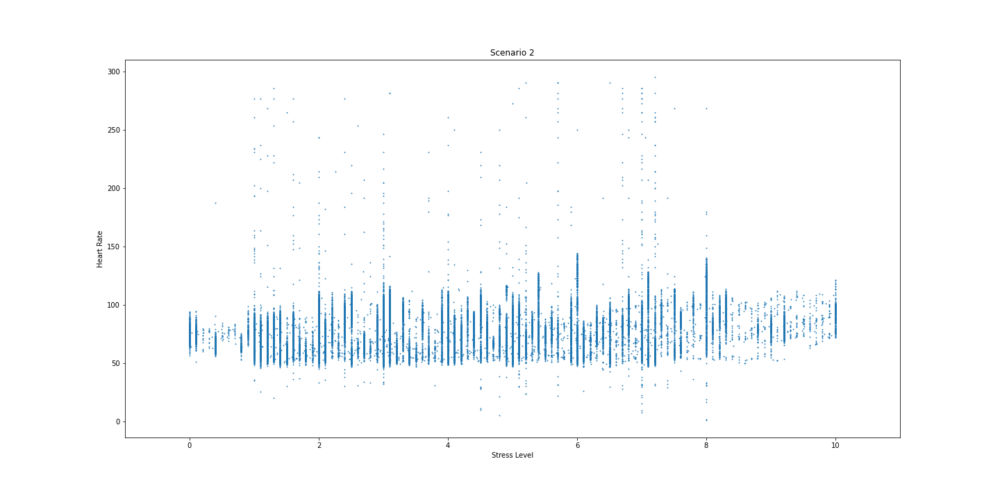

In [26]:
%matplotlib widget

plt.rcParams["figure.figsize"] = (20,10)
plt.scatter(sl_sc2_list,hr_sc2_list, s=0.7)
plt.title('Scenario 2')
plt.xlabel('Stress Level')
plt.ylabel('Heart Rate')
plt.xlim([-1,11])

plt.savefig(f"Graphics/GMLF_Distr_Sc2.pdf", format="pdf")

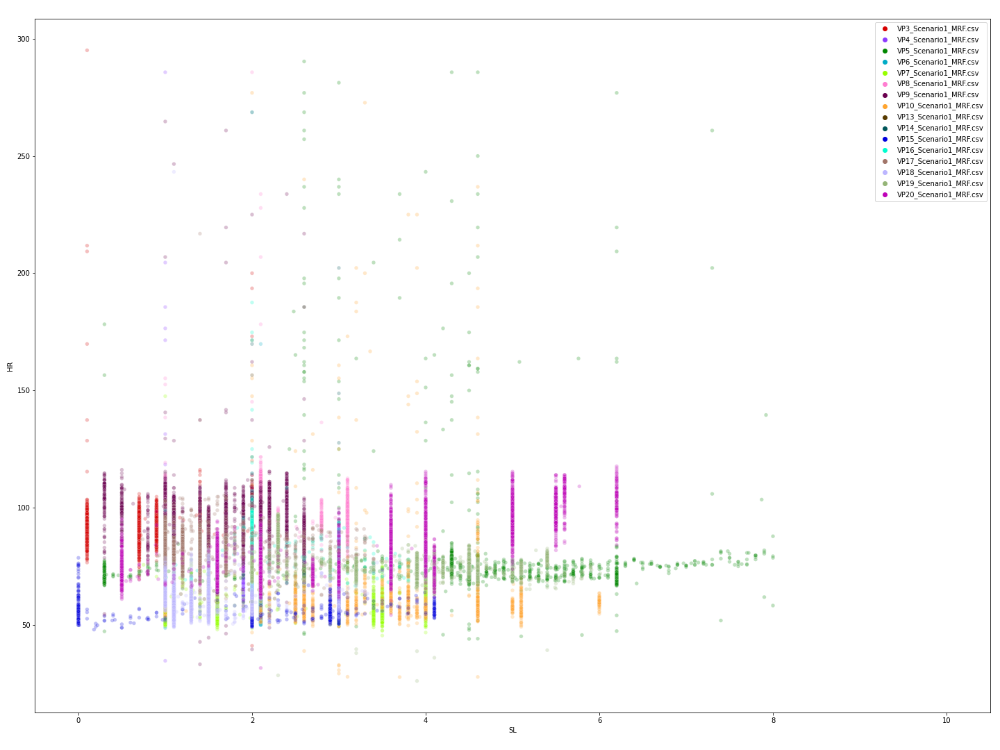

In [27]:
%matplotlib widget

plt.rcParams["figure.figsize"] = (20,15)
cc_palette_sc1 = sns.color_palette(cc.glasbey, n_colors=len(hrsl_sc1_df['FileName'].unique()))

sns.scatterplot(data=hrsl_sc1_df, x='SL', y='HR', hue='FileName', s=30, palette=cc_palette_sc1, alpha=0.25)
legend = plt.legend()
plt.xlim([-0.5,10.5])

plt.subplots_adjust(
    left=0.035,
    bottom=0.05,
    right=0.99,
    top=0.975,
    wspace=0.05,
    hspace=0)

plt.savefig(f"Graphics/GMLF_DistrColor_Sc1.pdf", format="pdf")

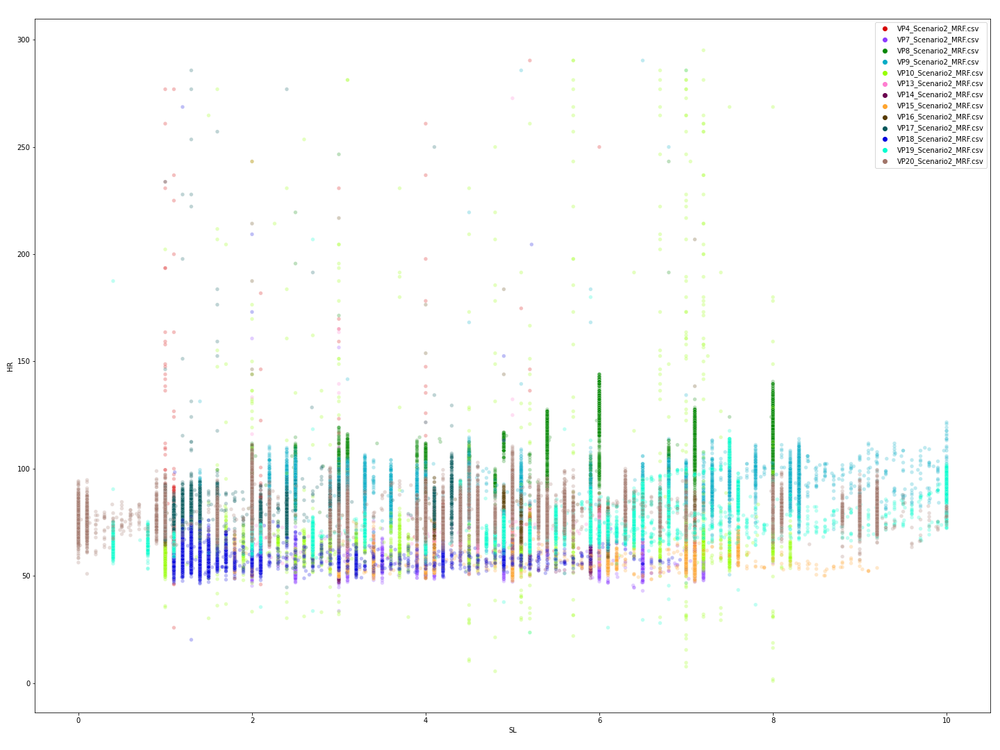

In [28]:
%matplotlib widget

plt.rcParams["figure.figsize"] = (20,15)
cc_palette = sns.color_palette(cc.glasbey, n_colors=len(hrsl_sc2_df['FileName'].unique()))

sns.scatterplot(data=hrsl_sc2_df, x='SL', y='HR', hue='FileName', s=30, palette=cc_palette, alpha=0.25)
legend = plt.legend()
plt.xlim([-0.5,10.5])
plt.subplots_adjust(
    left=0.035,
    bottom=0.05,
    right=0.99,
    top=0.975,
    wspace=0.05,
    hspace=0)
plt.savefig(f"Graphics/GMLF_DistrColor_Sc2.pdf", format="pdf")

In [29]:
len(hrsl_sc1_df['FileName'].unique())

16